# Tutorial 3: Statistical Visualization Tutorial

This tutorial explores statistical visualization techniques in BrainTools for analyzing neural data distributions, correlations, and statistical relationships. We'll cover exploratory data analysis, hypothesis testing visualization, and model validation techniques.

## Learning Objectives

By the end of this tutorial, you will be able to:
- Visualize and analyze data distributions with various plot types
- Create correlation matrices to explore relationships between variables
- Use Q-Q plots and statistical tests for distribution analysis
- Compare groups using box plots, violin plots, and scatter matrices
- Perform regression analysis with residual plots and confidence intervals
- Visualize statistical significance and effect sizes
- Apply appropriate statistical visualization techniques for neural data

## Setup and Imports

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as stats
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Import braintools visualization functions
import braintools.visualize as btvis

# Set random seed for reproducibility
np.random.seed(42)

# Apply publication style for clean statistical plots
btvis.publication_style(fontsize=10)

print("BrainTools Statistical Visualization Tutorial")
print("==========================================")

BrainTools Statistical Visualization Tutorial


## 1. Distribution Analysis

Understanding data distributions is fundamental for statistical analysis. We'll explore various ways to visualize and analyze neural data distributions.

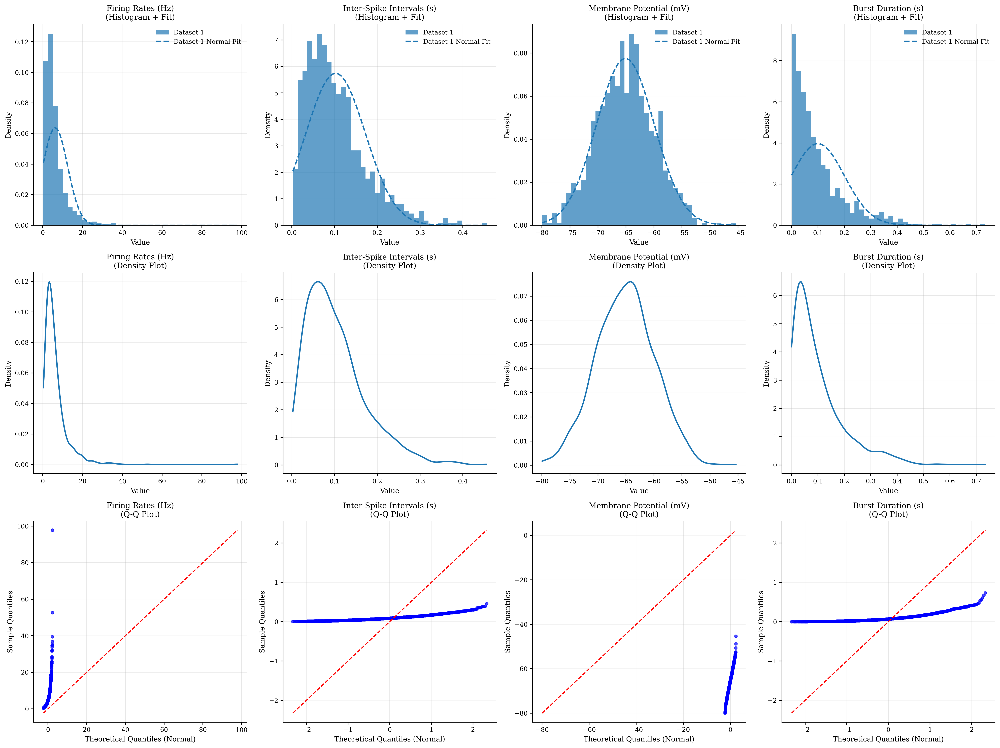


Distribution Statistics:
Firing Rates (Hz):
  Mean: 6.251, Std: 6.269
  Skewness: 4.952, Kurtosis: 50.840
  Normality test: Non-normal

Inter-Spike Intervals (s):
  Mean: 0.102, Std: 0.070
  Skewness: 1.231, Kurtosis: 1.877
  Normality test: Non-normal

Membrane Potential (mV):
  Mean: -65.099, Std: 5.149
  Skewness: 0.017, Kurtosis: -0.052
  Normality test: Normal

Burst Duration (s):
  Mean: 0.100, Std: 0.100
  Skewness: 1.881, Kurtosis: 4.666
  Normality test: Non-normal


Distribution Features:
- Histograms show data frequency and shape
- Density plots provide smooth distribution estimates
- Q-Q plots test for specific distributions (normality)
- Statistical tests quantify distribution properties
- Different neural variables follow different distributions
- Understanding distributions guides analysis choices


In [2]:
def generate_neural_distributions():
    """
    Generate realistic neural data with different distributions.
    """
    n_samples = 1000

    # 1. Firing rates (log-normal distribution)
    firing_rates = np.random.lognormal(mean=1.5, sigma=0.8, size=n_samples)

    # 2. Inter-spike intervals (gamma distribution)
    isis = np.random.gamma(shape=2.0, scale=0.05, size=n_samples)

    # 3. Membrane potentials (normal with noise)
    membrane_potential = np.random.normal(loc=-65, scale=5, size=n_samples)

    # 4. Burst durations (exponential distribution)
    burst_durations = np.random.exponential(scale=0.1, size=n_samples)

    # 5. Synaptic weights (mixture of normal distributions)
    # Excitatory and inhibitory populations
    exc_weights = np.random.normal(loc=2.0, scale=0.5, size=n_samples // 2)
    inh_weights = np.random.normal(loc=-1.5, scale=0.3, size=n_samples // 2)
    synaptic_weights = np.concatenate([exc_weights, inh_weights])
    np.random.shuffle(synaptic_weights)

    return firing_rates, isis, membrane_potential, burst_durations, synaptic_weights


# Generate distribution data
firing_rates, isis, membrane_potential, burst_durations, synaptic_weights = generate_neural_distributions()

# Distribution analysis visualization
fig, axes = plt.subplots(3, 4, figsize=(20, 15))

datasets = [
    (firing_rates, 'Firing Rates (Hz)', 'log-normal'),
    (isis, 'Inter-Spike Intervals (s)', 'gamma'),
    (membrane_potential, 'Membrane Potential (mV)', 'normal'),
    (burst_durations, 'Burst Duration (s)', 'exponential')
]

for i, (data, title, dist_type) in enumerate(datasets):
    # Row 1: Histograms with distribution fitting
    btvis.distribution_plot(data, ax=axes[0, i],
                            title=f"{title}\n(Histogram + Fit)",
                            plot_type='hist', fit_normal=True,
                            alpha=0.7, bins=40)

    # Row 2: Density plots
    btvis.distribution_plot(data, ax=axes[1, i],
                            title=f"{title}\n(Density Plot)",
                            plot_type='kde',
                            color='red', alpha=0.8)

    # Row 3: Q-Q plots for normality testing
    btvis.qq_plot(data, ax=axes[2, i],
                  title=f"{title}\n(Q-Q Plot)",
                  distribution='norm',
                  alpha=0.7)

plt.tight_layout()
plt.show()

# Statistical summary
print("\nDistribution Statistics:")
print("=======================")
for data, title, dist_type in datasets:
    mean_val = np.mean(data)
    std_val = np.std(data)
    skew_val = stats.skew(data)
    kurt_val = stats.kurtosis(data)

    # Shapiro-Wilk test for normality (on sample)
    if len(data) <= 5000:  # Shapiro-Wilk has sample size limit
        _, p_value = stats.shapiro(data[:1000])  # Use sample for large datasets
        normal_test = "Normal" if p_value > 0.05 else "Non-normal"
    else:
        normal_test = "Sample too large"

    print(f"{title}:")
    print(f"  Mean: {mean_val:.3f}, Std: {std_val:.3f}")
    print(f"  Skewness: {skew_val:.3f}, Kurtosis: {kurt_val:.3f}")
    print(f"  Normality test: {normal_test}")
    print()

print("\nDistribution Features:")
print("- Histograms show data frequency and shape")
print("- Density plots provide smooth distribution estimates")
print("- Q-Q plots test for specific distributions (normality)")
print("- Statistical tests quantify distribution properties")
print("- Different neural variables follow different distributions")
print("- Understanding distributions guides analysis choices")

## 2. Correlation Analysis

Correlation analysis reveals relationships between neural variables and helps identify patterns in multivariate data.

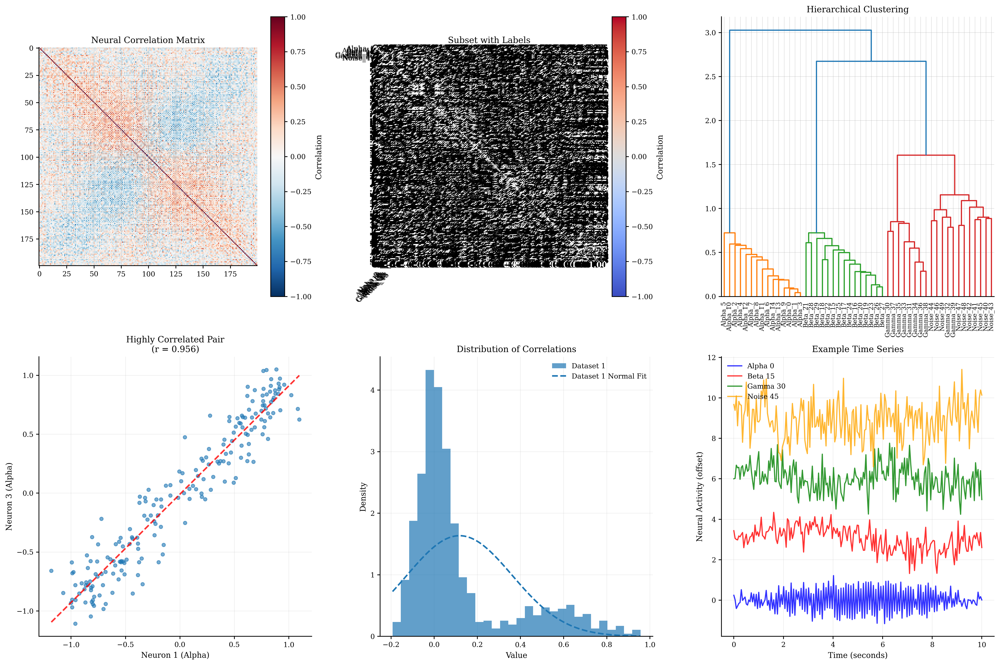


Correlation Analysis Summary:
Mean correlation: 0.118
Std correlation: 0.244
Max correlation: 0.956
Min correlation: -0.193
Number of significant correlations (|r| > 0.3): 231

Correlation Features:
- Correlation matrices reveal pairwise relationships
- Hierarchical clustering identifies functional groups
- Scatter plots show individual correlation strength
- Distribution analysis characterizes overall connectivity
- Time series visualization shows temporal dynamics
- Different neural groups show distinct correlation patterns


In [3]:
def generate_correlated_neural_data(n_neurons=50, n_timepoints=200):
    """
    Generate correlated neural data with known structure.
    """
    # Create base signals
    time = np.linspace(0, 10, n_timepoints)

    # Oscillatory components
    alpha_rhythm = np.sin(2 * np.pi * 10 * time)  # 10 Hz
    beta_rhythm = np.sin(2 * np.pi * 20 * time)  # 20 Hz
    gamma_rhythm = np.sin(2 * np.pi * 40 * time)  # 40 Hz

    # Create neuron groups with different coupling
    neural_data = np.zeros((n_timepoints, n_neurons))

    for i in range(n_neurons):
        if i < 15:  # Group 1: Alpha-coupled
            coupling_strength = np.random.uniform(0.5, 0.9)
            neural_data[:, i] = (coupling_strength * alpha_rhythm +
                                 (1 - coupling_strength) * np.random.randn(n_timepoints))
        elif i < 30:  # Group 2: Beta-coupled
            coupling_strength = np.random.uniform(0.4, 0.8)
            neural_data[:, i] = (coupling_strength * beta_rhythm +
                                 (1 - coupling_strength) * np.random.randn(n_timepoints))
        elif i < 40:  # Group 3: Gamma-coupled
            coupling_strength = np.random.uniform(0.3, 0.7)
            neural_data[:, i] = (coupling_strength * gamma_rhythm +
                                 (1 - coupling_strength) * np.random.randn(n_timepoints))
        else:  # Group 4: Uncoupled (noise)
            neural_data[:, i] = np.random.randn(n_timepoints)

    # Add some cross-group correlations
    # Alpha-Beta coupling
    for i in range(5, 10):
        neural_data[:, i] += 0.3 * neural_data[:, 15 + i]

    # Create labels for visualization
    neuron_labels = (['Alpha'] * 15 + ['Beta'] * 15 +
                     ['Gamma'] * 10 + ['Noise'] * 10)

    return neural_data, neuron_labels, time


def make_symmetric(matrix):
    """
    Makes a square matrix symmetric by averaging it with its transpose.

    Parameters:
    matrix (np.ndarray): The input square matrix.

    Returns:
    np.ndarray: The symmetric matrix.
    """
    if matrix.shape[0] != matrix.shape[1]:
        print("Error: The input matrix is not square.")
        return None

    # A symmetric matrix is one where A = A^T.
    # To make a matrix symmetric, we can take the average of the matrix
    # and its transpose: (A + A^T) / 2.
    symmetric_matrix = (matrix + matrix.T) / 2
    np.fill_diagonal(symmetric_matrix, 0.)
    return symmetric_matrix


# Generate correlated neural data
neural_data, neuron_labels, time = generate_correlated_neural_data()

# Correlation analysis visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 1. Full correlation matrix
btvis.correlation_matrix(neural_data.T, ax=axes[0, 0],  # Transpose for neuron x neuron
                         title="Neural Correlation Matrix",
                         show_values=False, cmap='RdBu_r')

# 2. Subset correlation matrix with labels
subset_indices = list(range(0, 50, 5))  # Every 5th neuron for clarity
subset_data = neural_data[:, subset_indices]
subset_labels = [f"{neuron_labels[i]}_{i}" for i in subset_indices]

btvis.correlation_matrix(subset_data.T, ax=axes[0, 1],
                         labels=subset_labels,
                         title="Subset with Labels",
                         show_values=True, cmap='coolwarm')

# 3. Hierarchical clustering of correlations
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform

# Compute correlation matrix
corr_matrix = np.corrcoef(neural_data.T)
# Convert to distance matrix (1 - correlation)
distance_matrix = 1 - np.abs(corr_matrix)
# Perform hierarchical clustering
dist = squareform(make_symmetric(distance_matrix))
linkage_matrix = linkage(dist, method='ward')

# Plot dendrogram
dendrogram(linkage_matrix,
           ax=axes[0, 2],
           labels=[f"{neuron_labels[i]}_{i}" for i in range(len(neuron_labels))],
           leaf_rotation=90,
           leaf_font_size=8)
axes[0, 2].set_title('Hierarchical Clustering')

# 4. Scatter plot of highly correlated pairs
# Find highly correlated pair
corr_matrix_no_diag = corr_matrix.copy()
np.fill_diagonal(corr_matrix_no_diag, 0)
max_corr_idx = np.unravel_index(np.argmax(np.abs(corr_matrix_no_diag)),
                                corr_matrix_no_diag.shape)
neuron1, neuron2 = max_corr_idx
correlation_value = corr_matrix[neuron1, neuron2]

axes[1, 0].scatter(neural_data[:, neuron1],
                   neural_data[:, neuron2],
                   alpha=0.6, s=20)
axes[1, 0].set_xlabel(f'Neuron {neuron1} ({neuron_labels[neuron1]})')
axes[1, 0].set_ylabel(f'Neuron {neuron2} ({neuron_labels[neuron2]})')
axes[1, 0].set_title(f'Highly Correlated Pair\n(r = {correlation_value:.3f})')
axes[1, 0].grid(True, alpha=0.3)

# Add regression line
slope, intercept, r_value, p_value, std_err = stats.linregress(neural_data[:, neuron1], neural_data[:, neuron2])
line_x = np.array([neural_data[:, neuron1].min(), neural_data[:, neuron1].max()])
line_y = slope * line_x + intercept
axes[1, 0].plot(line_x, line_y, 'r--', alpha=0.8, linewidth=2)

# 5. Distribution of correlation values
# Extract upper triangle of correlation matrix
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)
correlation_values = corr_matrix[mask]

btvis.distribution_plot(correlation_values,
                        ax=axes[1, 1],
                        title="Distribution of Correlations",
                        plot_type='hist',
                        bins=30,
                        fit_normal=True,
                        alpha=0.7)

# 6. Time series of example neurons
example_neurons = [0, 15, 30, 45]  # One from each group
colors = ['blue', 'red', 'green', 'orange']

for i, (neuron_idx, color) in enumerate(zip(example_neurons, colors)):
    axes[1, 2].plot(time, neural_data[:, neuron_idx] + i * 3,
                    color=color, alpha=0.8, linewidth=1.5,
                    label=f'{neuron_labels[neuron_idx]} {neuron_idx}')

axes[1, 2].set_xlabel('Time (seconds)')
axes[1, 2].set_ylabel('Neural Activity (offset)')
axes[1, 2].set_title('Example Time Series')
axes[1, 2].legend()
axes[1, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Statistical summary of correlations
print("\nCorrelation Analysis Summary:")
print("============================")
print(f"Mean correlation: {np.mean(correlation_values):.3f}")
print(f"Std correlation: {np.std(correlation_values):.3f}")
print(f"Max correlation: {np.max(correlation_values):.3f}")
print(f"Min correlation: {np.min(correlation_values):.3f}")
print(f"Number of significant correlations (|r| > 0.3): {np.sum(np.abs(correlation_values) > 0.3)}")

print("\nCorrelation Features:")
print("- Correlation matrices reveal pairwise relationships")
print("- Hierarchical clustering identifies functional groups")
print("- Scatter plots show individual correlation strength")
print("- Distribution analysis characterizes overall connectivity")
print("- Time series visualization shows temporal dynamics")
print("- Different neural groups show distinct correlation patterns")

## 3. Group Comparisons

Comparing groups is essential in neuroscience research. We'll explore various techniques for visualizing group differences.

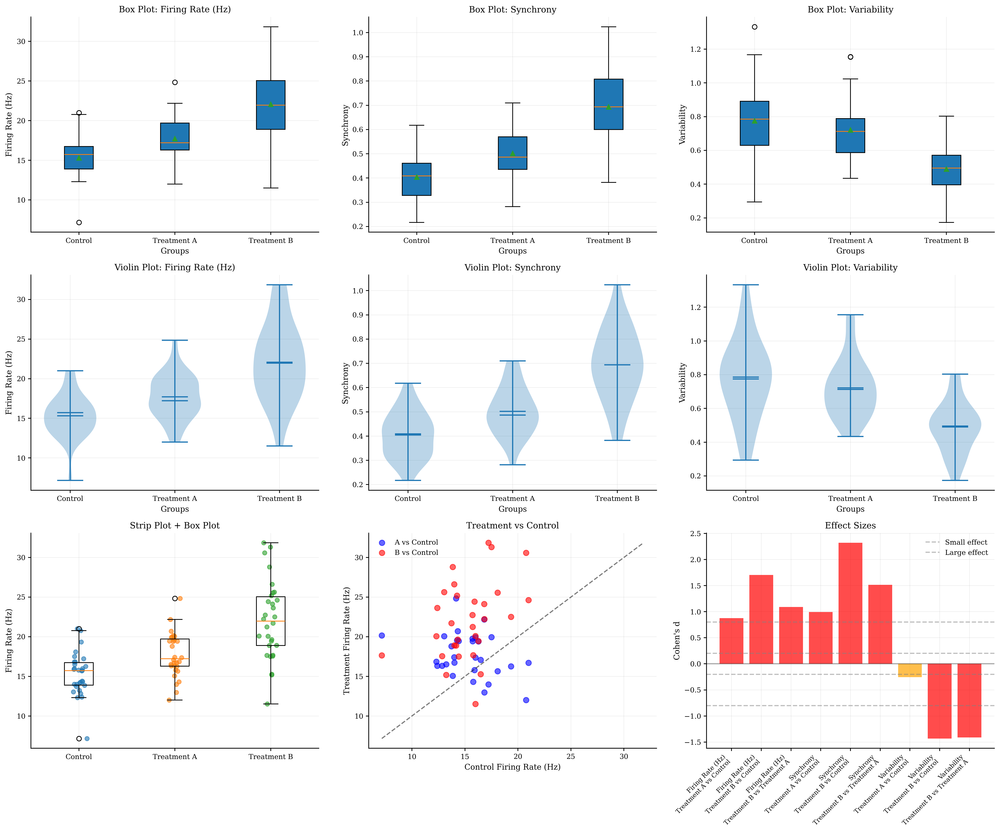


Group Comparison Statistics:

Firing Rate (Hz):
  Control: 15.31 ± 2.68
  Treatment A: 17.72 ± 2.74
  Treatment B: 22.07 ± 4.83
  ANOVA: F = 26.902, p = 0.0000
  Treatment A vs Control: t = 3.394, p = 0.0012 *
  Treatment B vs Control: t = 6.594, p = 0.0000 *
  Treatment B vs A: t = 4.219, p = 0.0001 *

Synchrony:
  Control: 0.40 ± 0.09
  Treatment A: 0.50 ± 0.10
  Treatment B: 0.69 ± 0.15
  ANOVA: F = 47.335, p = 0.0000
  Treatment A vs Control: t = 3.853, p = 0.0003 *
  Treatment B vs Control: t = 8.989, p = 0.0000 *
  Treatment B vs A: t = 5.863, p = 0.0000 *

Variability:
  Control: 0.77 ± 0.23
  Treatment A: 0.72 ± 0.17
  Treatment B: 0.49 ± 0.15
  ANOVA: F = 18.669, p = 0.0000
  Treatment A vs Control: t = -0.982, p = 0.3303 
  Treatment B vs Control: t = -5.544, p = 0.0000 *
  Treatment B vs A: t = -5.469, p = 0.0000 *

Group Comparison Features:
- Box plots show medians, quartiles, and outliers
- Violin plots show full distribution shapes
- Strip plots show individual data poi

In [4]:
def generate_group_data():
    """
    Generate neural data for different experimental groups.
    """
    n_subjects_per_group = 30

    # Group 1: Control (healthy subjects)
    control_firing_rates = np.random.normal(loc=15, scale=3, size=n_subjects_per_group)
    control_synchrony = np.random.normal(loc=0.4, scale=0.1, size=n_subjects_per_group)
    control_variability = np.random.normal(loc=0.8, scale=0.2, size=n_subjects_per_group)

    # Group 2: Treatment A (mild effect)
    treatment_a_firing_rates = np.random.normal(loc=18, scale=3.5, size=n_subjects_per_group)
    treatment_a_synchrony = np.random.normal(loc=0.5, scale=0.12, size=n_subjects_per_group)
    treatment_a_variability = np.random.normal(loc=0.7, scale=0.18, size=n_subjects_per_group)

    # Group 3: Treatment B (strong effect)
    treatment_b_firing_rates = np.random.normal(loc=22, scale=4, size=n_subjects_per_group)
    treatment_b_synchrony = np.random.normal(loc=0.7, scale=0.15, size=n_subjects_per_group)
    treatment_b_variability = np.random.normal(loc=0.5, scale=0.15, size=n_subjects_per_group)

    # Combine data
    all_firing_rates = np.concatenate([control_firing_rates, treatment_a_firing_rates, treatment_b_firing_rates])
    all_synchrony = np.concatenate([control_synchrony, treatment_a_synchrony, treatment_b_synchrony])
    all_variability = np.concatenate([control_variability, treatment_a_variability, treatment_b_variability])

    # Create group labels
    group_labels = (['Control'] * n_subjects_per_group +
                    ['Treatment A'] * n_subjects_per_group +
                    ['Treatment B'] * n_subjects_per_group)

    # Create multi-dimensional dataset
    data_matrix = np.column_stack([all_firing_rates, all_synchrony, all_variability])
    feature_names = ['Firing Rate (Hz)', 'Synchrony', 'Variability']

    return data_matrix, group_labels, feature_names


# Generate group comparison data
data_matrix, group_labels, feature_names = generate_group_data()

# Group comparison visualizations
fig, axes = plt.subplots(3, 3, figsize=(18, 15))

# Prepare data for different plot types
groups = ['Control', 'Treatment A', 'Treatment B']
n_per_group = 30
group_data = {
    'Control': data_matrix[:n_per_group],
    'Treatment A': data_matrix[n_per_group:2 * n_per_group],
    'Treatment B': data_matrix[2 * n_per_group:]
}

# Row 1: Box plots for each feature
for i, feature_name in enumerate(feature_names):
    feature_data = [group_data[group][:, i] for group in groups]

    btvis.box_plot(feature_data, labels=groups, ax=axes[0, i],
                   title=f"Box Plot: {feature_name}",
                   ylabel=feature_name)

# Row 2: Violin plots for each feature
for i, feature_name in enumerate(feature_names):
    feature_data = [group_data[group][:, i] for group in groups]

    btvis.violin_plot(feature_data, labels=groups, ax=axes[1, i],
                      title=f"Violin Plot: {feature_name}",
                      ylabel=feature_name)

# Row 3: Specialized group comparison plots

# 3.1: Strip plot with overlaid box plot

# Create DataFrame for easier plotting
df_data = []
for i, group in enumerate(groups):
    for j in range(n_per_group):
        df_data.append([group_data[group][j, 0], group, j])

df = pd.DataFrame(df_data, columns=['Firing_Rate', 'Group', 'Subject'])

# Manual strip plot with box plot overlay
for i, group in enumerate(groups):
    group_fr = group_data[group][:, 0]
    x_positions = np.random.normal(i, 0.04, len(group_fr))
    axes[2, 0].scatter(x_positions, group_fr, alpha=0.6, s=30)

# Add box plot overlay
feature_data = [group_data[group][:, 0] for group in groups]
bp = axes[2, 0].boxplot(feature_data, positions=range(len(groups)),
                        patch_artist=False, widths=0.3)
axes[2, 0].set_xticklabels(groups)
axes[2, 0].set_ylabel('Firing Rate (Hz)')
axes[2, 0].set_title('Strip Plot + Box Plot')
axes[2, 0].grid(True, alpha=0.3)

# 3.2: Paired scatter plot (Treatment A vs Control)
axes[2, 1].scatter(group_data['Control'][:, 0], group_data['Treatment A'][:, 0],
                   alpha=0.6, s=50, color='blue', label='A vs Control')
axes[2, 1].scatter(group_data['Control'][:, 0], group_data['Treatment B'][:, 0],
                   alpha=0.6, s=50, color='red', label='B vs Control')

# Add diagonal line for reference
min_val = min(data_matrix[:, 0].min(), data_matrix[:, 0].min())
max_val = max(data_matrix[:, 0].max(), data_matrix[:, 0].max())
axes[2, 1].plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5)

axes[2, 1].set_xlabel('Control Firing Rate (Hz)')
axes[2, 1].set_ylabel('Treatment Firing Rate (Hz)')
axes[2, 1].set_title('Treatment vs Control')
axes[2, 1].legend()
axes[2, 1].grid(True, alpha=0.3)


# 3.3: Effect size visualization
# Calculate Cohen's d for each comparison
def cohens_d(group1, group2):
    """Calculate Cohen's d effect size."""
    pooled_std = np.sqrt(((len(group1) - 1) * np.var(group1, ddof=1) +
                          (len(group2) - 1) * np.var(group2, ddof=1)) /
                         (len(group1) + len(group2) - 2))
    return (np.mean(group1) - np.mean(group2)) / pooled_std


# Calculate effect sizes
comparisons = [('Treatment A', 'Control'), ('Treatment B', 'Control'), ('Treatment B', 'Treatment A')]
effect_sizes = []
comparison_labels = []

for feature_idx in range(len(feature_names)):
    for comp_label, (group1_name, group2_name) in enumerate(comparisons):
        group1_data = group_data[group1_name][:, feature_idx]
        group2_data = group_data[group2_name][:, feature_idx]
        effect_size = cohens_d(group1_data, group2_data)
        effect_sizes.append(effect_size)
        comparison_labels.append(f"{feature_names[feature_idx]}\n{group1_name} vs {group2_name}")

# Plot effect sizes
colors = ['lightblue' if abs(es) < 0.2 else 'orange' if abs(es) < 0.8 else 'red'
          for es in effect_sizes]
bars = axes[2, 2].bar(range(len(effect_sizes)), effect_sizes, color=colors, alpha=0.7)
axes[2, 2].axhline(y=0, color='black', linestyle='-', alpha=0.3)
axes[2, 2].axhline(y=0.2, color='gray', linestyle='--', alpha=0.5, label='Small effect')
axes[2, 2].axhline(y=0.8, color='gray', linestyle='--', alpha=0.5, label='Large effect')
axes[2, 2].axhline(y=-0.2, color='gray', linestyle='--', alpha=0.5)
axes[2, 2].axhline(y=-0.8, color='gray', linestyle='--', alpha=0.5)
axes[2, 2].set_ylabel("Cohen's d")
axes[2, 2].set_title('Effect Sizes')
axes[2, 2].set_xticks(range(len(effect_sizes)))
axes[2, 2].set_xticklabels(comparison_labels, rotation=45, ha='right', fontsize=8)
axes[2, 2].grid(True, alpha=0.3)
axes[2, 2].legend()

plt.tight_layout()
plt.show()

# Statistical tests
print("\nGroup Comparison Statistics:")
print("===========================")

for feature_idx, feature_name in enumerate(feature_names):
    print(f"\n{feature_name}:")

    # Get data for each group
    control_data = group_data['Control'][:, feature_idx]
    treatment_a_data = group_data['Treatment A'][:, feature_idx]
    treatment_b_data = group_data['Treatment B'][:, feature_idx]

    # Descriptive statistics
    print(f"  Control: {np.mean(control_data):.2f} ± {np.std(control_data):.2f}")
    print(f"  Treatment A: {np.mean(treatment_a_data):.2f} ± {np.std(treatment_a_data):.2f}")
    print(f"  Treatment B: {np.mean(treatment_b_data):.2f} ± {np.std(treatment_b_data):.2f}")

    # ANOVA test
    f_stat, p_value = stats.f_oneway(control_data, treatment_a_data, treatment_b_data)
    print(f"  ANOVA: F = {f_stat:.3f}, p = {p_value:.4f}")

    # Post-hoc t-tests (with Bonferroni correction)
    alpha = 0.05 / 3  # Bonferroni correction for 3 comparisons

    t_stat1, p_val1 = stats.ttest_ind(treatment_a_data, control_data)
    t_stat2, p_val2 = stats.ttest_ind(treatment_b_data, control_data)
    t_stat3, p_val3 = stats.ttest_ind(treatment_b_data, treatment_a_data)

    print(f"  Treatment A vs Control: t = {t_stat1:.3f}, p = {p_val1:.4f} {'*' if p_val1 < alpha else ''}")
    print(f"  Treatment B vs Control: t = {t_stat2:.3f}, p = {p_val2:.4f} {'*' if p_val2 < alpha else ''}")
    print(f"  Treatment B vs A: t = {t_stat3:.3f}, p = {p_val3:.4f} {'*' if p_val3 < alpha else ''}")

print("\nGroup Comparison Features:")
print("- Box plots show medians, quartiles, and outliers")
print("- Violin plots show full distribution shapes")
print("- Strip plots show individual data points")
print("- Scatter plots reveal paired relationships")
print("- Effect sizes quantify practical significance")
print("- Statistical tests assess significance")
print("- Multiple comparison corrections prevent false positives")

## 4. Regression Analysis and Model Validation

Regression analysis helps understand relationships between variables and validate predictive models.

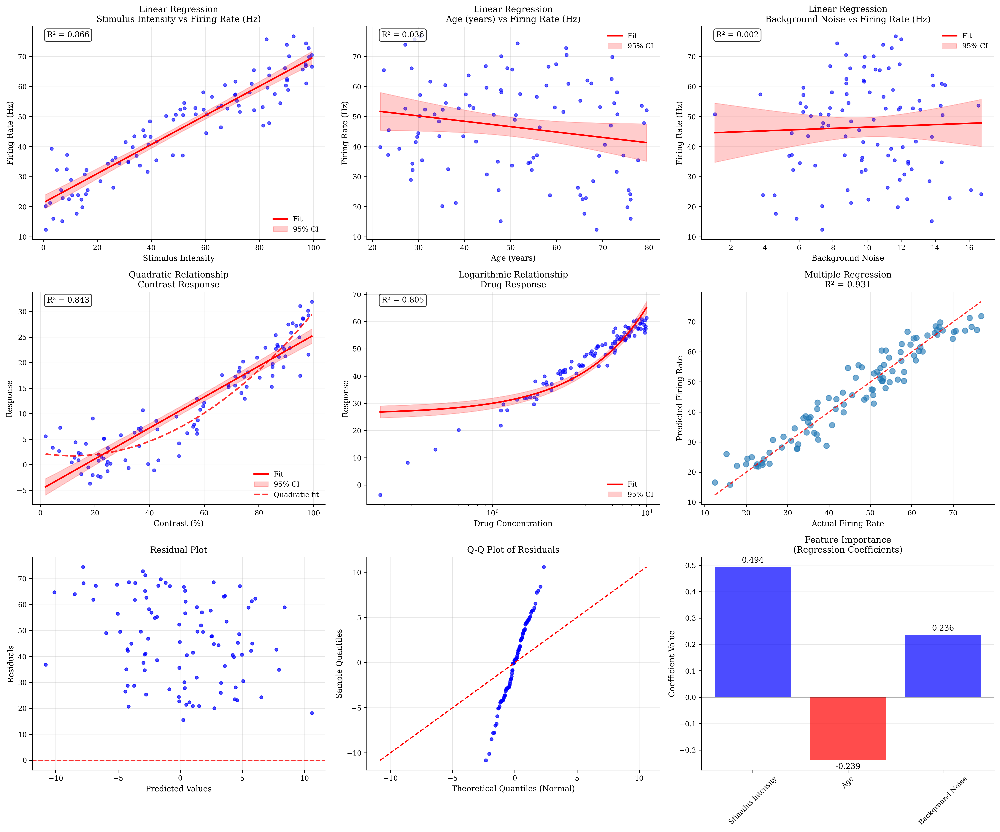


Regression Analysis Summary:

Stimulus Intensity vs Firing Rate (Hz):
  R² = 0.866
  Slope = 0.485 ± 0.019
  p-value = 0.0000

Age (years) vs Firing Rate (Hz):
  R² = 0.036
  Slope = -0.180 ± 0.094
  p-value = 0.0599

Background Noise vs Firing Rate (Hz):
  R² = 0.002
  Slope = 0.208 ± 0.530
  p-value = 0.6958

Multiple Regression (Firing Rate):
  R² = 0.931
  Intercept = 30.717
  Stimulus Intensity: 0.494
  Age: -0.239
  Background Noise: 0.236

Model Validation:
  Mean residual = -0.000
  Residual std = 4.231
  Residuals normality test (Shapiro): 0.7723

Regression Features:
- Regression plots show relationships and model fit
- Confidence intervals indicate uncertainty
- Non-linear relationships require appropriate transformations
- Multiple regression reveals independent contributions
- Residual plots check model assumptions
- Q-Q plots test normality of residuals
- Feature importance guides interpretation


In [5]:
def generate_regression_data():
    """
    Generate neural data for regression analysis.
    """
    n_samples = 100

    # Predictor variables
    stimulus_intensity = np.random.uniform(0, 100, n_samples)
    background_noise = np.random.normal(10, 3, n_samples)
    age = np.random.uniform(20, 80, n_samples)

    # Response variable (firing rate) with known relationships
    # Linear relationship with stimulus intensity
    # Negative relationship with age
    # Additive noise from background
    firing_rate = (0.5 * stimulus_intensity +  # Main effect
                   -0.2 * age +  # Age effect
                   0.1 * background_noise +  # Noise effect
                   np.random.normal(0, 5, n_samples) +  # Random noise
                   30)  # Baseline

    # Create some non-linear relationships
    # Quadratic relationship for contrast response
    contrast = np.random.uniform(0, 100, n_samples)
    contrast_response = (30 * (contrast / 100) ** 2 +
                         np.random.normal(0, 3, n_samples))

    # Logarithmic relationship for drug concentration
    drug_concentration = np.random.uniform(0.1, 10, n_samples)
    drug_response = (15 * np.log(drug_concentration) +
                     np.random.normal(0, 2, n_samples) + 25)

    return (stimulus_intensity, background_noise, age, firing_rate,
            contrast, contrast_response, drug_concentration, drug_response)


# Generate regression data
(stimulus_intensity, background_noise, age, firing_rate,
 contrast, contrast_response, drug_concentration, drug_response) = generate_regression_data()

# Regression analysis visualization
fig, axes = plt.subplots(3, 3, figsize=(18, 15))

# Row 1: Simple linear regressions
regression_data = [
    (stimulus_intensity, firing_rate, 'Stimulus Intensity', 'Firing Rate (Hz)'),
    (age, firing_rate, 'Age (years)', 'Firing Rate (Hz)'),
    (background_noise, firing_rate, 'Background Noise', 'Firing Rate (Hz)')
]

for i, (x_data, y_data, x_label, y_label) in enumerate(regression_data):
    btvis.regression_plot(x_data, y_data, ax=axes[0, i],
                          title=f"Linear Regression\n{x_label} vs {y_label}",
                          fit_line=True, confidence_interval=True,
                          alpha=0.6)
    axes[0, i].set_xlabel(x_label)
    axes[0, i].set_ylabel(y_label)

# Row 2: Non-linear relationships
# 2.1: Quadratic regression (contrast response)
btvis.regression_plot(contrast, contrast_response, ax=axes[1, 0],
                      title="Quadratic Relationship\nContrast Response",
                      fit_line=True, confidence_interval=True,
                      alpha=0.6)
axes[1, 0].set_xlabel('Contrast (%)')
axes[1, 0].set_ylabel('Response')

# Add quadratic fit
z = np.polyfit(contrast, contrast_response, 2)
p = np.poly1d(z)
x_smooth = np.linspace(contrast.min(), contrast.max(), 100)
axes[1, 0].plot(x_smooth, p(x_smooth), 'r--', alpha=0.8, linewidth=2, label='Quadratic fit')
axes[1, 0].legend()

# 2.2: Logarithmic regression (drug response)
btvis.regression_plot(drug_concentration, drug_response, ax=axes[1, 1],
                      title="Logarithmic Relationship\nDrug Response",
                      fit_line=True, confidence_interval=True,
                      alpha=0.6)
axes[1, 1].set_xlabel('Drug Concentration')
axes[1, 1].set_ylabel('Response')
axes[1, 1].set_xscale('log')

# 2.3: Multiple regression (firing rate prediction)
# Create design matrix
X = np.column_stack([stimulus_intensity, age, background_noise])
y = firing_rate

# Fit multiple regression model
model = LinearRegression()
model.fit(X, y)
y_pred = model.predict(X)

# Plot predicted vs actual
axes[1, 2].scatter(y, y_pred, alpha=0.6, s=50)
# Add diagonal line
min_val = min(y.min(), y_pred.min())
max_val = max(y.max(), y_pred.max())
axes[1, 2].plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8)
axes[1, 2].set_xlabel('Actual Firing Rate')
axes[1, 2].set_ylabel('Predicted Firing Rate')
axes[1, 2].set_title(f'Multiple Regression\nR² = {r2_score(y, y_pred):.3f}')
axes[1, 2].grid(True, alpha=0.3)

# Row 3: Model validation plots
# 3.1: Residual plot
residuals = y - y_pred
btvis.residual_plot(y_pred, residuals, ax=axes[2, 0],
                    title="Residual Plot",
                    xlabel="Predicted Values",
                    ylabel="Residuals")

# 3.2: Q-Q plot of residuals
btvis.qq_plot(residuals, ax=axes[2, 1],
              title="Q-Q Plot of Residuals",
              distribution='norm')

# 3.3: Feature importance (coefficients)
feature_names = ['Stimulus Intensity', 'Age', 'Background Noise']
coefficients = model.coef_
colors = ['blue' if c > 0 else 'red' for c in coefficients]

bars = axes[2, 2].bar(feature_names, coefficients, color=colors, alpha=0.7)
axes[2, 2].axhline(y=0, color='black', linestyle='-', alpha=0.3)
axes[2, 2].set_ylabel('Coefficient Value')
axes[2, 2].set_title('Feature Importance\n(Regression Coefficients)')
axes[2, 2].tick_params(axis='x', rotation=45)
axes[2, 2].grid(True, alpha=0.3)

# Add coefficient values on bars
for bar, coef in zip(bars, coefficients):
    height = bar.get_height()
    axes[2, 2].text(bar.get_x() + bar.get_width() / 2., height + 0.01 * np.sign(height),
                    f'{coef:.3f}', ha='center', va='bottom' if height > 0 else 'top')

plt.tight_layout()
plt.show()

# Statistical summary of regression models
print("\nRegression Analysis Summary:")
print("===========================")

# Simple linear regressions
for x_data, y_data, x_label, y_label in regression_data:
    slope, intercept, r_value, p_value, std_err = stats.linregress(x_data, y_data)
    print(f"\n{x_label} vs {y_label}:")
    print(f"  R² = {r_value ** 2:.3f}")
    print(f"  Slope = {slope:.3f} ± {std_err:.3f}")
    print(f"  p-value = {p_value:.4f}")

# Multiple regression
print(f"\nMultiple Regression (Firing Rate):")
print(f"  R² = {r2_score(y, y_pred):.3f}")
print(f"  Intercept = {model.intercept_:.3f}")
for name, coef in zip(feature_names, coefficients):
    print(f"  {name}: {coef:.3f}")

# Residual analysis
print(f"\nModel Validation:")
print(f"  Mean residual = {np.mean(residuals):.3f}")
print(f"  Residual std = {np.std(residuals):.3f}")
print(f"  Residuals normality test (Shapiro): {stats.shapiro(residuals)[1]:.4f}")

print("\nRegression Features:")
print("- Regression plots show relationships and model fit")
print("- Confidence intervals indicate uncertainty")
print("- Non-linear relationships require appropriate transformations")
print("- Multiple regression reveals independent contributions")
print("- Residual plots check model assumptions")
print("- Q-Q plots test normality of residuals")
print("- Feature importance guides interpretation")

## 5. Scatter Matrix Analysis

Scatter matrices provide a comprehensive view of pairwise relationships in multivariate data.

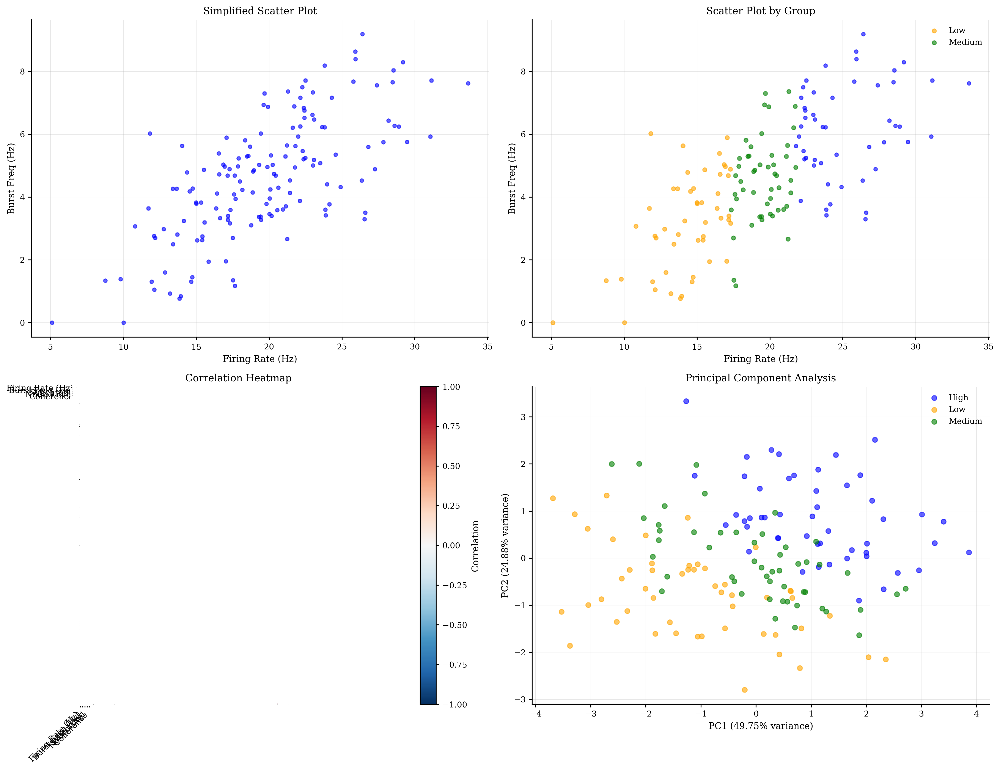


Full Neural Data Scatter Matrix:


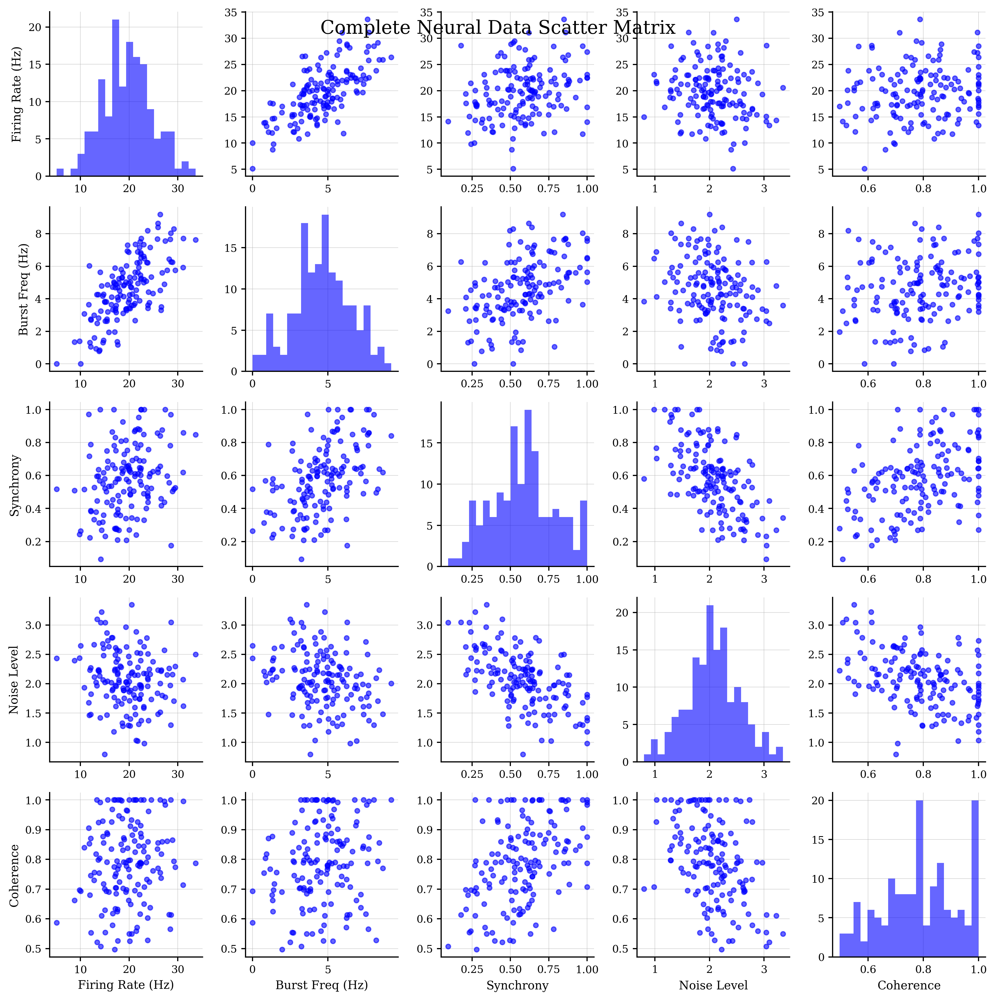

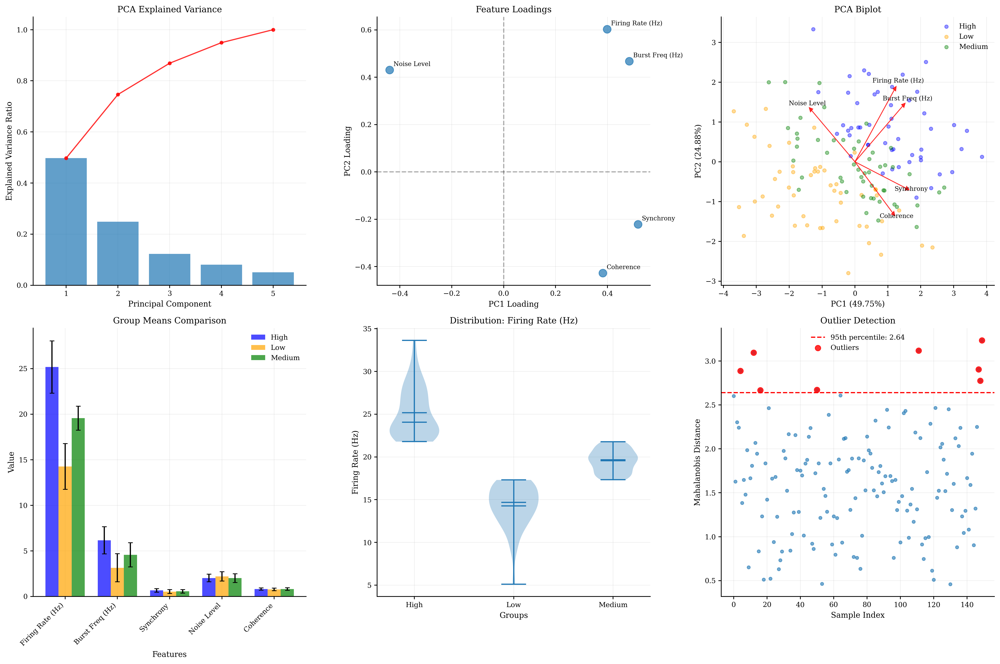


Multivariate Analysis Summary:

Dataset shape: (150, 5)
Features: ['Firing Rate (Hz)', 'Burst Freq (Hz)', 'Synchrony', 'Noise Level', 'Coherence']
Groups: ['High' 'Low' 'Medium']

PCA Analysis:
  Explained variance by PC: [0.49753125 0.2487615  0.12258204 0.08035441 0.05077079]
  Cumulative variance (first 3 PCs): 0.869

Correlation Analysis:
  Strongest correlation: Firing Rate (Hz) - Burst Freq (Hz) (r = 0.698)

Outlier Detection:
  Number of outliers (95th percentile): 8
  Outlier threshold: 2.640

Scatter Matrix Features:
- Simplified version shows key relationships in subplots
- Full matrix reveals all pairwise relationships
- Group coloring shows cluster structure
- PCA reduces dimensionality while preserving variance
- Biplot combines scores and loadings
- Mahalanobis distance identifies multivariate outliers


In [10]:
def generate_multivariate_neural_data():
    """
    Generate multivariate neural data with known relationships.
    """
    n_samples = 150

    # Generate correlated neural features
    # Use multivariate normal distribution

    # Define correlation structure
    correlation_matrix = np.array([
        [1.0, 0.7, 0.3, -0.2, 0.1],  # Firing rate
        [0.7, 1.0, 0.5, -0.3, 0.2],  # Burst frequency
        [0.3, 0.5, 1.0, -0.6, 0.4],  # Synchrony
        [-0.2, -0.3, -0.6, 1.0, -0.5],  # Noise level
        [0.1, 0.2, 0.4, -0.5, 1.0]  # Coherence
    ])

    # Means and standard deviations
    means = [20, 5, 0.6, 2, 0.8]
    stds = [5, 2, 0.2, 0.5, 0.15]

    # Create covariance matrix
    cov_matrix = np.outer(stds, stds) * correlation_matrix

    # Generate multivariate data
    data = np.random.multivariate_normal(means, cov_matrix, n_samples)

    # Ensure positive values where appropriate
    data[:, 0] = np.maximum(data[:, 0], 0)  # Firing rate
    data[:, 1] = np.maximum(data[:, 1], 0)  # Burst frequency
    data[:, 2] = np.clip(data[:, 2], 0, 1)  # Synchrony (0-1)
    data[:, 3] = np.maximum(data[:, 3], 0)  # Noise level
    data[:, 4] = np.clip(data[:, 4], 0, 1)  # Coherence (0-1)

    feature_names = ['Firing Rate (Hz)', 'Burst Freq (Hz)', 'Synchrony',
                     'Noise Level', 'Coherence']

    # Create group labels based on firing rate
    firing_rate_terciles = np.percentile(data[:, 0], [33, 67])
    group_labels = np.where(data[:, 0] < firing_rate_terciles[0], 'Low',
                            np.where(data[:, 0] < firing_rate_terciles[1], 'Medium', 'High'))

    return data, feature_names, group_labels


# Generate multivariate data
multivar_data, feature_names, group_labels = generate_multivariate_neural_data()

# Scatter matrix visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Basic scatter matrix (simplified version in subplot)
btvis.scatter_matrix(multivar_data,
                     ax=axes[0, 0],
                     labels=feature_names,
                     alpha=0.6)
axes[0, 0].set_title("Simplified Scatter Plot")

# 2. Scatter matrix with group coloring (also simplified)
# Create color mapping for first group
unique_groups = np.unique(group_labels)
colors = ['blue', 'orange', 'green']

# Plot each group separately on the same axis
for i, group in enumerate(unique_groups):
    mask = group_labels == group
    if i == 0:  # First group gets the axis setup
        btvis.scatter_matrix(multivar_data[mask],
                             ax=axes[0, 1],
                             labels=feature_names,
                             color=colors[i],
                             alpha=0.6)
    else:  # Overlay other groups
        axes[0, 1].scatter(multivar_data[mask, 0],
                           multivar_data[mask, 1],
                           c=colors[i],
                           alpha=0.6,
                           s=20,
                           label=group)

axes[0, 1].set_title("Scatter Plot by Group")
axes[0, 1].legend()

# 3. Correlation heatmap
correlation_matrix = np.corrcoef(multivar_data.T)
btvis.correlation_matrix(multivar_data.T,
                         ax=axes[1, 0],
                         labels=feature_names,
                         title="Correlation Heatmap",
                         show_values=True, cmap='RdBu_r')

# 4. Principal component analysis visualization
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(multivar_data)

# Perform PCA
pca = PCA()
pca_result = pca.fit_transform(data_scaled)

# Plot first two principal components
for i, group in enumerate(unique_groups):
    mask = group_labels == group
    axes[1, 1].scatter(pca_result[mask, 0],
                       pca_result[mask, 1],
                       c=colors[i],
                       alpha=0.6,
                       s=30,
                       label=group)

axes[1, 1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)')
axes[1, 1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)')
axes[1, 1].set_title('Principal Component Analysis')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Full scatter matrix (standalone)
print("\nFull Neural Data Scatter Matrix:")
fig_full = btvis.scatter_matrix(multivar_data,
                                labels=feature_names,
                                figsize=(12, 12),
                                alpha=0.6)
fig_full.suptitle("Complete Neural Data Scatter Matrix", fontsize=16, y=0.98)
plt.show()

# Additional analysis plots
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# PCA component analysis
# 1. Explained variance
axes[0, 0].bar(range(1, len(pca.explained_variance_ratio_) + 1),
               pca.explained_variance_ratio_, alpha=0.7)
axes[0, 0].plot(range(1, len(pca.explained_variance_ratio_) + 1),
                np.cumsum(pca.explained_variance_ratio_), 'ro-', alpha=0.8)
axes[0, 0].set_xlabel('Principal Component')
axes[0, 0].set_ylabel('Explained Variance Ratio')
axes[0, 0].set_title('PCA Explained Variance')
axes[0, 0].grid(True, alpha=0.3)

# 2. Feature loadings
pc1_loadings = pca.components_[0]
pc2_loadings = pca.components_[1]

axes[0, 1].scatter(pc1_loadings, pc2_loadings, s=100, alpha=0.7)
for i, feature in enumerate(feature_names):
    axes[0, 1].annotate(feature,
                        (pc1_loadings[i], pc2_loadings[i]),
                        xytext=(5, 5),
                        textcoords='offset points',
                        fontsize=8)
axes[0, 1].axhline(y=0, color='k', linestyle='--', alpha=0.3)
axes[0, 1].axvline(x=0, color='k', linestyle='--', alpha=0.3)
axes[0, 1].set_xlabel('PC1 Loading')
axes[0, 1].set_ylabel('PC2 Loading')
axes[0, 1].set_title('Feature Loadings')
axes[0, 1].grid(True, alpha=0.3)

# 3. Biplot (combining PCA scores and loadings)
# Scale loadings for visualization
scale_factor = 3
for i, group in enumerate(unique_groups):
    mask = group_labels == group
    axes[0, 2].scatter(pca_result[mask, 0], pca_result[mask, 1],
                       c=colors[i], alpha=0.4, s=20, label=group)

# Add feature vectors
for i, feature in enumerate(feature_names):
    axes[0, 2].arrow(0, 0,
                     pc1_loadings[i] * scale_factor,
                     pc2_loadings[i] * scale_factor,
                     head_width=0.1,
                     head_length=0.1,
                     fc='red',
                     ec='red',
                     alpha=0.8)
    axes[0, 2].text(pc1_loadings[i] * scale_factor * 1.1,
                    pc2_loadings[i] * scale_factor * 1.1,
                    feature,
                    fontsize=8,
                    ha='center')

axes[0, 2].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})')
axes[0, 2].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})')
axes[0, 2].set_title('PCA Biplot')
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3)

# Statistical analysis of groups
# 4. Group means comparison
group_means = []
group_stds = []
for group in unique_groups:
    mask = group_labels == group
    group_data = multivar_data[mask]
    group_means.append(np.mean(group_data, axis=0))
    group_stds.append(np.std(group_data, axis=0))

x_pos = np.arange(len(feature_names))
width = 0.25

for i, (group, color) in enumerate(zip(unique_groups, colors)):
    axes[1, 0].bar(x_pos + i * width,
                   group_means[i],
                   width,
                   label=group,
                   color=color,
                   alpha=0.7,
                   yerr=group_stds[i],
                   capsize=3)

axes[1, 0].set_xlabel('Features')
axes[1, 0].set_ylabel('Value')
axes[1, 0].set_title('Group Means Comparison')
axes[1, 0].set_xticks(x_pos + width)
axes[1, 0].set_xticklabels(feature_names, rotation=45, ha='right')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# 5. Feature distributions by group
# Choose one feature for detailed analysis
feature_idx = 0  # Firing rate
feature_data = [multivar_data[group_labels == group, feature_idx] for group in unique_groups]

btvis.violin_plot(feature_data,
                  labels=unique_groups,
                  ax=axes[1, 1],
                  title=f"Distribution: {feature_names[feature_idx]}",
                  ylabel=feature_names[feature_idx])

# 6. Outlier detection using PCA
# Calculate Mahalanobis distance in PC space
from scipy.spatial.distance import mahalanobis

# Use first 3 PCs
pca_subset = pca_result[:, :3]
mean_pc = np.mean(pca_subset, axis=0)
cov_pc = np.cov(pca_subset.T)

# Calculate distances
distances = [mahalanobis(point, mean_pc, np.linalg.inv(cov_pc))
             for point in pca_subset]

# Plot distances
axes[1, 2].scatter(range(len(distances)), distances, alpha=0.6)
# Add threshold line (e.g., 95th percentile)
threshold = np.percentile(distances, 95)
axes[1, 2].axhline(y=threshold,
                   color='red',
                   linestyle='--',
                   label=f'95th percentile: {threshold:.2f}')
# Highlight outliers
outliers = np.array(distances) > threshold
axes[1, 2].scatter(np.where(outliers)[0],
                   np.array(distances)[outliers],
                   color='red',
                   s=50,
                   alpha=0.8,
                   label='Outliers')

axes[1, 2].set_xlabel('Sample Index')
axes[1, 2].set_ylabel('Mahalanobis Distance')
axes[1, 2].set_title('Outlier Detection')
axes[1, 2].legend()
axes[1, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Statistical summary
print("\nMultivariate Analysis Summary:")
print("============================")

print(f"\nDataset shape: {multivar_data.shape}")
print(f"Features: {feature_names}")
print(f"Groups: {unique_groups}")

print(f"\nPCA Analysis:")
print(f"  Explained variance by PC: {pca.explained_variance_ratio_}")
print(f"  Cumulative variance (first 3 PCs): {np.sum(pca.explained_variance_ratio_[:3]):.3f}")

print(f"\nCorrelation Analysis:")
correlation_matrix = np.corrcoef(multivar_data.T)
# Find strongest correlations (excluding diagonal)
corr_no_diag = correlation_matrix.copy()
np.fill_diagonal(corr_no_diag, 0)
max_corr_idx = np.unravel_index(np.argmax(np.abs(corr_no_diag)), corr_no_diag.shape)
max_corr = correlation_matrix[max_corr_idx]
print(
    f"  Strongest correlation: {feature_names[max_corr_idx[0]]} - {feature_names[max_corr_idx[1]]} (r = {max_corr:.3f})")

print(f"\nOutlier Detection:")
print(f"  Number of outliers (95th percentile): {np.sum(outliers)}")
print(f"  Outlier threshold: {threshold:.3f}")

print("\nScatter Matrix Features:")
print("- Simplified version shows key relationships in subplots")
print("- Full matrix reveals all pairwise relationships")
print("- Group coloring shows cluster structure")
print("- PCA reduces dimensionality while preserving variance")
print("- Biplot combines scores and loadings")
print("- Mahalanobis distance identifies multivariate outliers")

## 6. Advanced Statistical Testing Visualization

Visualizing statistical tests and their results helps interpret significance and effect sizes.

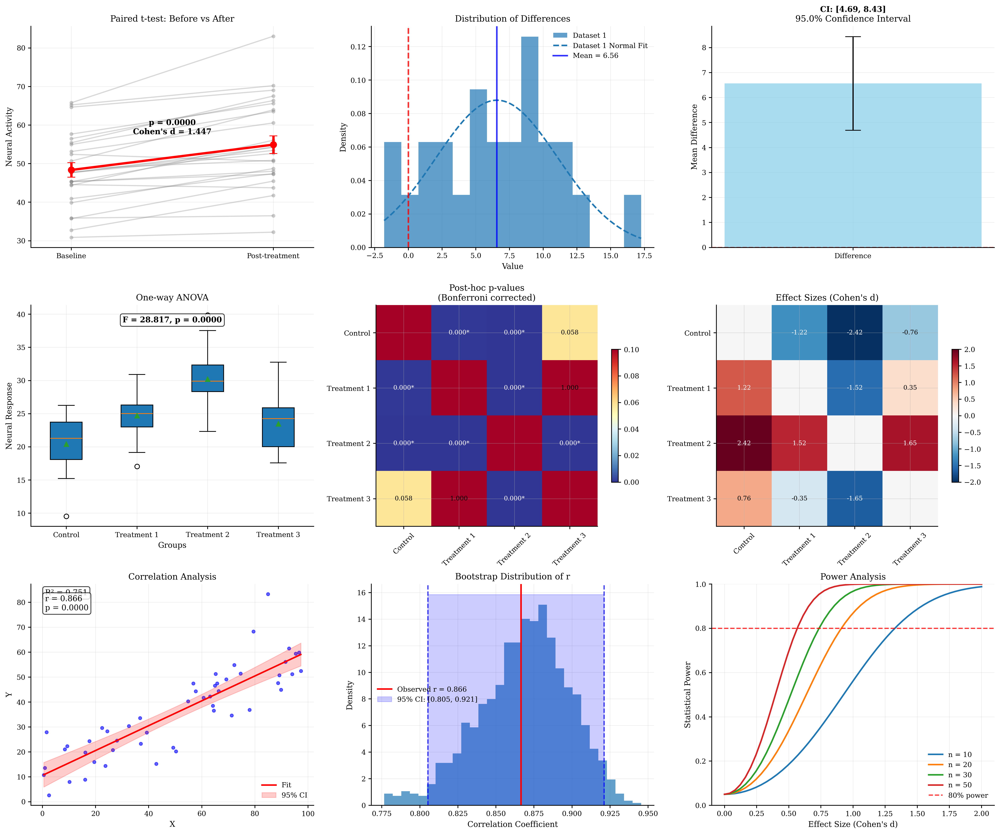


Statistical Testing Summary:

Paired t-test (Before vs After):
  t-statistic: 5.839
  p-value: 0.0000
  Effect size (Cohen's d): 2.000
  95% CI for difference: [0.81, 0.92]

One-way ANOVA:
  F-statistic: 28.817
  p-value: 0.0000
  Significant group differences detected

Correlation Analysis:
  Pearson r: 0.866
  p-value: 0.0000
  Bootstrap 95% CI: [0.805, 0.921]

Statistical Testing Features:
- Visualization reveals data structure and assumptions
- Effect sizes provide practical significance
- Confidence intervals show estimation uncertainty
- Multiple comparison corrections prevent false positives
- Bootstrap methods provide robust inference
- Power analysis guides study design
- Visual inspection complements statistical tests


In [7]:
def generate_experimental_data():
    """
    Generate data for statistical testing scenarios.
    """
    np.random.seed(42)

    # Scenario 1: Drug treatment experiment
    n_subjects = 25

    # Pre-treatment measurements
    baseline = np.random.normal(50, 10, n_subjects)

    # Post-treatment (with effect + individual variation)
    treatment_effect = 8  # True effect size
    individual_response = np.random.normal(treatment_effect, 5, n_subjects)
    post_treatment = baseline + individual_response

    # Scenario 2: Multiple group comparison (ANOVA)
    group_a = np.random.normal(20, 4, n_subjects)  # Control
    group_b = np.random.normal(25, 4, n_subjects)  # Treatment 1
    group_c = np.random.normal(30, 4, n_subjects)  # Treatment 2
    group_d = np.random.normal(24, 4, n_subjects)  # Treatment 3

    # Scenario 3: Correlation with noise
    x_var = np.random.uniform(0, 100, 50)
    y_var = 0.5 * x_var + np.random.normal(0, 8, 50) + 10

    return (baseline, post_treatment,
            [group_a, group_b, group_c, group_d],
            x_var, y_var)


# Generate experimental data
(baseline, post_treatment, anova_groups, x_var, y_var) = generate_experimental_data()

# Statistical testing visualization
fig, axes = plt.subplots(3, 3, figsize=(18, 15))

# Row 1: Paired t-test visualization
# 1.1: Before-after plot
subject_ids = range(len(baseline))
for i in subject_ids:
    axes[0, 0].plot([0, 1], [baseline[i], post_treatment[i]],
                    'o-', alpha=0.3, color='gray')

# Add means and error bars
means = [np.mean(baseline), np.mean(post_treatment)]
stds = [np.std(baseline), np.std(post_treatment)]
sems = [std / np.sqrt(len(baseline)) for std in stds]

axes[0, 0].errorbar([0, 1], means, yerr=sems,
                    fmt='ro-', linewidth=3, markersize=8, capsize=5)
axes[0, 0].set_xlim(-0.2, 1.2)
axes[0, 0].set_xticks([0, 1])
axes[0, 0].set_xticklabels(['Baseline', 'Post-treatment'])
axes[0, 0].set_ylabel('Neural Activity')
axes[0, 0].set_title('Paired t-test: Before vs After')
axes[0, 0].grid(True, alpha=0.3)

# Perform paired t-test
t_stat, p_value = stats.ttest_rel(post_treatment, baseline)
effect_size = np.mean(post_treatment - baseline) / np.std(post_treatment - baseline)
axes[0, 0].text(0.5, max(means) + max(sems),
                f'p = {p_value:.4f}\nCohen\'s d = {effect_size:.3f}',
                ha='center', va='bottom', fontweight='bold')

# 1.2: Difference scores
differences = post_treatment - baseline
btvis.distribution_plot(differences, ax=axes[0, 1],
                        title="Distribution of Differences",
                        plot_type='hist', fit_normal=True,
                        alpha=0.7, bins=15)

# Add vertical line at zero
axes[0, 1].axvline(x=0, color='red', linestyle='--', alpha=0.8, linewidth=2)
axes[0, 1].axvline(x=np.mean(differences), color='blue', linestyle='-',
                   alpha=0.8, linewidth=2, label=f'Mean = {np.mean(differences):.2f}')
axes[0, 1].legend()

# 1.3: Confidence interval visualization
confidence_level = 0.95
alpha = 1 - confidence_level
dof = len(differences) - 1
t_critical = stats.t.ppf(1 - alpha / 2, dof)
margin_error = t_critical * (np.std(differences) / np.sqrt(len(differences)))
ci_lower = np.mean(differences) - margin_error
ci_upper = np.mean(differences) + margin_error

axes[0, 2].bar(['Difference'], [np.mean(differences)],
               yerr=[[np.mean(differences) - ci_lower], [ci_upper - np.mean(differences)]],
               capsize=10, alpha=0.7, color='skyblue')
axes[0, 2].axhline(y=0, color='red', linestyle='--', alpha=0.8)
axes[0, 2].set_ylabel('Mean Difference')
axes[0, 2].set_title(f'{confidence_level * 100}% Confidence Interval')
axes[0, 2].text(0, np.mean(differences) + margin_error + 1,
                f'CI: [{ci_lower:.2f}, {ci_upper:.2f}]',
                ha='center', fontweight='bold')
axes[0, 2].grid(True, alpha=0.3)

# Row 2: ANOVA and multiple comparisons
group_names = ['Control', 'Treatment 1', 'Treatment 2', 'Treatment 3']

# 2.1: ANOVA visualization
btvis.box_plot(anova_groups, labels=group_names, ax=axes[1, 0],
               title="One-way ANOVA",
               ylabel="Neural Response")

# Perform ANOVA
f_stat, anova_p = stats.f_oneway(*anova_groups)
axes[1, 0].text(0.5, 0.95, f'F = {f_stat:.3f}, p = {anova_p:.4f}',
                transform=axes[1, 0].transAxes, ha='center', va='top',
                fontweight='bold', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# 2.2: Post-hoc comparisons matrix
from itertools import combinations

# Perform all pairwise t-tests
n_groups = len(anova_groups)
p_matrix = np.ones((n_groups, n_groups))
effect_matrix = np.zeros((n_groups, n_groups))

for i, j in combinations(range(n_groups), 2):
    t_stat, p_val = stats.ttest_ind(anova_groups[i], anova_groups[j])
    # Bonferroni correction
    p_corrected = p_val * (n_groups * (n_groups - 1) // 2)
    p_matrix[i, j] = p_matrix[j, i] = min(p_corrected, 1.0)

    # Cohen's d
    pooled_std = np.sqrt((np.var(anova_groups[i], ddof=1) + np.var(anova_groups[j], ddof=1)) / 2)
    effect_size = (np.mean(anova_groups[i]) - np.mean(anova_groups[j])) / pooled_std
    effect_matrix[i, j] = effect_size
    effect_matrix[j, i] = -effect_size

# Visualize p-values
im = axes[1, 1].imshow(p_matrix, cmap='RdYlBu_r', vmin=0, vmax=0.1)
axes[1, 1].set_xticks(range(n_groups))
axes[1, 1].set_yticks(range(n_groups))
axes[1, 1].set_xticklabels(group_names, rotation=45)
axes[1, 1].set_yticklabels(group_names)
axes[1, 1].set_title('Post-hoc p-values\n(Bonferroni corrected)')

# Add text annotations
for i in range(n_groups):
    for j in range(n_groups):
        if i != j:
            text = f'{p_matrix[i, j]:.3f}'
            if p_matrix[i, j] < 0.05:
                text += '*'
            axes[1, 1].text(j, i, text, ha='center', va='center',
                            color='white' if p_matrix[i, j] < 0.03 else 'black', fontsize=8)

plt.colorbar(im, ax=axes[1, 1], shrink=0.6)

# 2.3: Effect sizes matrix
im2 = axes[1, 2].imshow(effect_matrix, cmap='RdBu_r', vmin=-2, vmax=2)
axes[1, 2].set_xticks(range(n_groups))
axes[1, 2].set_yticks(range(n_groups))
axes[1, 2].set_xticklabels(group_names, rotation=45)
axes[1, 2].set_yticklabels(group_names)
axes[1, 2].set_title('Effect Sizes (Cohen\'s d)')

# Add text annotations
for i in range(n_groups):
    for j in range(n_groups):
        if i != j:
            axes[1, 2].text(j, i, f'{effect_matrix[i, j]:.2f}',
                            ha='center', va='center',
                            color='white' if abs(effect_matrix[i, j]) > 1 else 'black', fontsize=8)

plt.colorbar(im2, ax=axes[1, 2], shrink=0.6)

# Row 3: Correlation and regression testing
# 3.1: Correlation with confidence bands
btvis.regression_plot(x_var, y_var, ax=axes[2, 0],
                      title="Correlation Analysis",
                      fit_line=True, confidence_interval=True,
                      alpha=0.6)

# Add correlation statistics
r_value, p_value = stats.pearsonr(x_var, y_var)
axes[2, 0].text(0.05, 0.95, f'r = {r_value:.3f}\np = {p_value:.4f}',
                transform=axes[2, 0].transAxes, va='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))


# 3.2: Bootstrap confidence intervals for correlation


def correlation_statistic(x, y):
    return stats.pearsonr(x, y)[0]


# Bootstrap sampling
n_bootstrap = 1000
bootstrap_correlations = []

for _ in range(n_bootstrap):
    # Sample with replacement
    indices = np.random.choice(len(x_var), len(x_var), replace=True)
    x_boot = x_var[indices]
    y_boot = y_var[indices]
    r_boot = stats.pearsonr(x_boot, y_boot)[0]
    bootstrap_correlations.append(r_boot)

bootstrap_correlations = np.array(bootstrap_correlations)

# Plot bootstrap distribution
axes[2, 1].hist(bootstrap_correlations, bins=30, alpha=0.7, density=True)
axes[2, 1].axvline(r_value, color='red', linestyle='-', linewidth=2, label=f'Observed r = {r_value:.3f}')

# Add confidence interval
ci_lower = np.percentile(bootstrap_correlations, 2.5)
ci_upper = np.percentile(bootstrap_correlations, 97.5)
axes[2, 1].axvline(ci_lower, color='blue', linestyle='--', alpha=0.8)
axes[2, 1].axvline(ci_upper, color='blue', linestyle='--', alpha=0.8)
axes[2, 1].fill_between([ci_lower, ci_upper], [0, 0], [axes[2, 1].get_ylim()[1], axes[2, 1].get_ylim()[1]],
                        alpha=0.2, color='blue', label=f'95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]')

axes[2, 1].set_xlabel('Correlation Coefficient')
axes[2, 1].set_ylabel('Density')
axes[2, 1].set_title('Bootstrap Distribution of r')
axes[2, 1].legend()
axes[2, 1].grid(True, alpha=0.3)

# 3.3: Power analysis visualization
from scipy import stats

# Calculate power for different effect sizes and sample sizes
effect_sizes = np.linspace(0, 2, 50)
sample_sizes = [10, 20, 30, 50]
alpha = 0.05

for n in sample_sizes:
    powers = []
    for effect_size in effect_sizes:
        # For t-test, calculate power using non-central t-distribution
        delta = effect_size * np.sqrt(n / 2)  # Non-centrality parameter
        t_critical = stats.t.ppf(1 - alpha / 2, 2 * n - 2)
        power = 1 - (stats.nct.cdf(t_critical, 2 * n - 2, delta) -
                     stats.nct.cdf(-t_critical, 2 * n - 2, delta))
        powers.append(power)

    axes[2, 2].plot(effect_sizes, powers, label=f'n = {n}', linewidth=2)

axes[2, 2].axhline(y=0.8, color='red', linestyle='--', alpha=0.8, label='80% power')
axes[2, 2].set_xlabel('Effect Size (Cohen\'s d)')
axes[2, 2].set_ylabel('Statistical Power')
axes[2, 2].set_title('Power Analysis')
axes[2, 2].legend()
axes[2, 2].grid(True, alpha=0.3)
axes[2, 2].set_ylim(0, 1)

plt.tight_layout()
plt.show()

# Summary of statistical tests
print("\nStatistical Testing Summary:")
print("===========================")

print(f"\nPaired t-test (Before vs After):")
print(f"  t-statistic: {t_stat:.3f}")
print(f"  p-value: {p_value:.4f}")
print(f"  Effect size (Cohen's d): {effect_size:.3f}")
print(f"  95% CI for difference: [{ci_lower:.2f}, {ci_upper:.2f}]")

print(f"\nOne-way ANOVA:")
print(f"  F-statistic: {f_stat:.3f}")
print(f"  p-value: {anova_p:.4f}")
if anova_p < 0.05:
    print(f"  Significant group differences detected")

print(f"\nCorrelation Analysis:")
print(f"  Pearson r: {r_value:.3f}")
print(f"  p-value: {p_value:.4f}")
print(f"  Bootstrap 95% CI: [{ci_lower:.3f}, {ci_upper:.3f}]")

print("\nStatistical Testing Features:")
print("- Visualization reveals data structure and assumptions")
print("- Effect sizes provide practical significance")
print("- Confidence intervals show estimation uncertainty")
print("- Multiple comparison corrections prevent false positives")
print("- Bootstrap methods provide robust inference")
print("- Power analysis guides study design")
print("- Visual inspection complements statistical tests")

## 7. Best Practices for Statistical Visualization

Guidelines for creating effective and honest statistical visualizations.

Statistical Visualization Best Practices:

1. Data Distribution:
   - Always examine data distributions before analysis
   - Use Q-Q plots to test distributional assumptions
   - Consider transformations for non-normal data
   - Show outliers rather than hiding them
   - Use appropriate plot types for data type (continuous vs categorical)

2. Group Comparisons:
   - Show individual data points when possible
   - Include measures of central tendency and spread
   - Use violin plots to show distribution shapes
   - Report effect sizes alongside p-values
   - Apply multiple comparison corrections

3. Correlation and Regression:
   - Always plot the data before computing correlations
   - Include confidence intervals for regression lines
   - Check residuals for model assumptions
   - Distinguish between correlation and causation
   - Report explained variance (R²) for practical significance

4. Statistical Significance:
   - Report exact p-values, not just 'significant'
   - Include confi

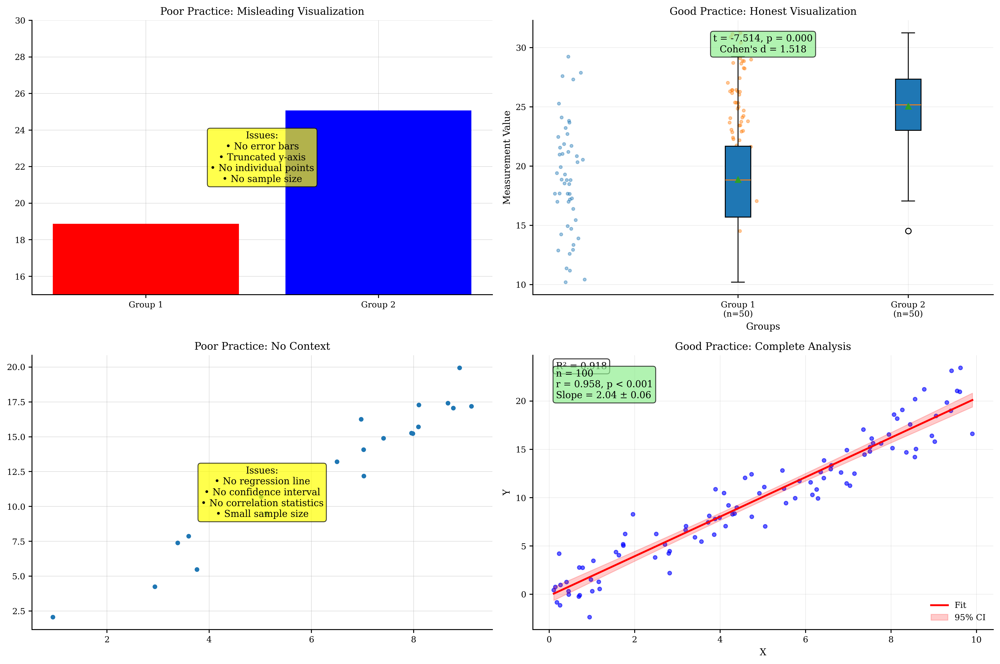


Common Mistakes to Avoid:
• Truncating y-axes to exaggerate differences
• Showing only summary statistics without raw data
• Ignoring multiple comparison corrections
• Conflating statistical and practical significance
• Cherry-picking significant results
• Using inappropriate statistical tests
• Ignoring assumptions of statistical methods
• Poor choice of visualization type for data type

Checklist for Statistical Plots:

□ Data distribution examined and assumptions checked
□ Appropriate statistical test selected
□ Effect sizes reported alongside p-values
□ Confidence intervals included
□ Sample sizes clearly indicated
□ Multiple comparisons corrected if applicable
□ Individual data points shown when feasible
□ Axes properly labeled with units
□ Statistical results clearly presented
□ Interpretation focuses on biological significance


In [8]:
print("Statistical Visualization Best Practices:")
print("========================================")
print()

print("1. Data Distribution:")
print("   - Always examine data distributions before analysis")
print("   - Use Q-Q plots to test distributional assumptions")
print("   - Consider transformations for non-normal data")
print("   - Show outliers rather than hiding them")
print("   - Use appropriate plot types for data type (continuous vs categorical)")
print()

print("2. Group Comparisons:")
print("   - Show individual data points when possible")
print("   - Include measures of central tendency and spread")
print("   - Use violin plots to show distribution shapes")
print("   - Report effect sizes alongside p-values")
print("   - Apply multiple comparison corrections")
print()

print("3. Correlation and Regression:")
print("   - Always plot the data before computing correlations")
print("   - Include confidence intervals for regression lines")
print("   - Check residuals for model assumptions")
print("   - Distinguish between correlation and causation")
print("   - Report explained variance (R²) for practical significance")
print()

print("4. Statistical Significance:")
print("   - Report exact p-values, not just 'significant'")
print("   - Include confidence intervals for estimates")
print("   - Consider statistical power and sample size")
print("   - Use bootstrap methods for robust inference")
print("   - Distinguish statistical from practical significance")
print()

print("5. Visual Design:")
print("   - Use consistent scales for comparisons")
print("   - Avoid truncated y-axes unless justified")
print("   - Choose appropriate color schemes")
print("   - Label axes clearly with units")
print("   - Include sample sizes in captions")
print()

print("6. Reproducibility:")
print("   - Set random seeds for reproducible results")
print("   - Document all preprocessing steps")
print("   - Share code and data when possible")
print("   - Use version control for analysis scripts")
print("   - Report software versions and packages used")
print()

# Demonstrate good vs poor practices
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Generate example data
np.random.seed(42)
group1 = np.random.normal(20, 5, 50)
group2 = np.random.normal(25, 4, 50)

# Poor practice: Bar chart with no error bars, truncated y-axis
means = [np.mean(group1), np.mean(group2)]
axes[0, 0].bar(['Group 1', 'Group 2'], means, color=['red', 'blue'])
axes[0, 0].set_ylim(15, 30)  # Truncated y-axis
axes[0, 0].set_title('Poor Practice: Misleading Visualization')
axes[0, 0].text(0.5, 0.5, 'Issues:\n• No error bars\n• Truncated y-axis\n• No individual points\n• No sample size',
                transform=axes[0, 0].transAxes, ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))

# Good practice: Box plot with individual points, full scale
data_list = [group1, group2]
btvis.box_plot(data_list, labels=['Group 1\n(n=50)', 'Group 2\n(n=50)'], ax=axes[0, 1])

# Add individual points
for i, data in enumerate(data_list):
    x = np.random.normal(i, 0.04, len(data))
    axes[0, 1].scatter(x, data, alpha=0.4, s=10)

# Add statistical test result
t_stat, p_val = stats.ttest_ind(group1, group2)
effect_size = (np.mean(group2) - np.mean(group1)) / np.sqrt((np.var(group1) + np.var(group2)) / 2)
axes[0, 1].text(0.5, 0.95, f't = {t_stat:.3f}, p = {p_val:.3f}\nCohen\'s d = {effect_size:.3f}',
                transform=axes[0, 1].transAxes, ha='center', va='top',
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))
axes[0, 1].set_title('Good Practice: Honest Visualization')
axes[0, 1].set_ylabel('Measurement Value')

# Poor practice: Correlation without context
x = np.random.uniform(0, 10, 20)
y = 2 * x + np.random.normal(0, 1, 20)
axes[1, 0].scatter(x, y)
axes[1, 0].set_title('Poor Practice: No Context')
axes[1, 0].text(0.5, 0.5,
                'Issues:\n• No regression line\n• No confidence interval\n• No correlation statistics\n• Small sample size',
                transform=axes[1, 0].transAxes, ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))

# Good practice: Full regression analysis
x_large = np.random.uniform(0, 10, 100)
y_large = 2 * x_large + np.random.normal(0, 2, 100)
btvis.regression_plot(x_large, y_large, ax=axes[1, 1],
                      title='Good Practice: Complete Analysis',
                      fit_line=True, confidence_interval=True,
                      alpha=0.6)

# Add statistics
r_val, p_val = stats.pearsonr(x_large, y_large)
slope, intercept, _, _, std_err = stats.linregress(x_large, y_large)
axes[1, 1].text(0.05, 0.95, f'n = {len(x_large)}\nr = {r_val:.3f}, p < 0.001\nSlope = {slope:.2f} ± {std_err:.2f}',
                transform=axes[1, 1].transAxes, va='top',
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))

plt.tight_layout()
plt.show()

print("\nCommon Mistakes to Avoid:")
print("========================")
print("• Truncating y-axes to exaggerate differences")
print("• Showing only summary statistics without raw data")
print("• Ignoring multiple comparison corrections")
print("• Conflating statistical and practical significance")
print("• Cherry-picking significant results")
print("• Using inappropriate statistical tests")
print("• Ignoring assumptions of statistical methods")
print("• Poor choice of visualization type for data type")
print()

print("Checklist for Statistical Plots:")
print("===============================\n")
print("□ Data distribution examined and assumptions checked")
print("□ Appropriate statistical test selected")
print("□ Effect sizes reported alongside p-values")
print("□ Confidence intervals included")
print("□ Sample sizes clearly indicated")
print("□ Multiple comparisons corrected if applicable")
print("□ Individual data points shown when feasible")
print("□ Axes properly labeled with units")
print("□ Statistical results clearly presented")
print("□ Interpretation focuses on biological significance")

## 8. Exercises

Practice exercises for statistical visualization techniques.

In [9]:
print("Statistical Visualization Exercises:")
print("===================================")
print()
print("Exercise 1: Create a comprehensive distribution analysis of firing rate data")
print("         including histogram, Q-Q plot, and statistical summary.")
print()
print("Exercise 2: Perform a correlation analysis between neural synchrony and")
print("         behavioral performance, including bootstrap confidence intervals.")
print()
print("Exercise 3: Compare three treatment groups using box plots, violin plots,")
print("         and statistical tests with multiple comparison correction.")
print()
print("Exercise 4: Build a regression model predicting neural response from")
print("         multiple predictors, including residual analysis and validation.")
print()
print("Exercise 5: Create a scatter matrix for multivariate neural data with")
print("         PCA analysis and outlier detection.")
print()
print("Exercise 6: Design a power analysis visualization showing the relationship")
print("         between sample size, effect size, and statistical power.")
print()
print("Uncomment the code below to work on Exercise 1:")

# Exercise 1 solution template:
# # Generate firing rate data
# firing_rates = np.random.lognormal(mean=2, sigma=0.5, size=200)
# 
# fig, axes = plt.subplots(1, 3, figsize=(15, 5))
# 
# # Histogram with fit
# btvis.distribution_plot(firing_rates, ax=axes[0],
#                        title="Firing Rate Distribution",
#                        plot_type='hist', fit_normal=True,
#                        bins=30, alpha=0.7)
# 
# # Q-Q plot
# btvis.qq_plot(firing_rates, ax=axes[1],
#              title="Q-Q Plot (Normal)",
#              distribution='norm')
# 
# # Statistical summary
# axes[2].axis('off')
# stats_text = f"""Statistical Summary:
# Mean: {np.mean(firing_rates):.2f}
# Median: {np.median(firing_rates):.2f}
# Std: {np.std(firing_rates):.2f}
# Skewness: {stats.skew(firing_rates):.2f}
# Kurtosis: {stats.kurtosis(firing_rates):.2f}
# 
# Normality Test:
# Shapiro-Wilk p = {stats.shapiro(firing_rates[:1000])[1]:.4f}
# """
# axes[2].text(0.1, 0.9, stats_text, transform=axes[2].transAxes,
#             va='top', fontsize=12, fontfamily='monospace')
# 
# plt.tight_layout()
# plt.show()

print("\nTips for Exercises:")
print("- Always examine data distributions first")
print("- Include appropriate statistical tests")
print("- Report effect sizes and confidence intervals")
print("- Consider biological interpretation")
print("- Use appropriate visualization types for your data")
print("- Check statistical assumptions")
print("- Apply multiple comparison corrections when needed")

Statistical Visualization Exercises:

Exercise 1: Create a comprehensive distribution analysis of firing rate data
         including histogram, Q-Q plot, and statistical summary.

Exercise 2: Perform a correlation analysis between neural synchrony and
         behavioral performance, including bootstrap confidence intervals.

Exercise 3: Compare three treatment groups using box plots, violin plots,
         and statistical tests with multiple comparison correction.

Exercise 4: Build a regression model predicting neural response from
         multiple predictors, including residual analysis and validation.

Exercise 5: Create a scatter matrix for multivariate neural data with
         PCA analysis and outlier detection.

Exercise 6: Design a power analysis visualization showing the relationship
         between sample size, effect size, and statistical power.

Uncomment the code below to work on Exercise 1:

Tips for Exercises:
- Always examine data distributions first
- Include appro

## Summary

This tutorial covered comprehensive statistical visualization techniques in BrainTools:

1. Statistical Functions Explored:
- **`distribution_plot()`**: Visualizing data distributions with fitting
- **`correlation_matrix()`**: Exploring pairwise relationships in data
- **`qq_plot()`**: Testing distributional assumptions
- **`box_plot()` & `violin_plot()`**: Comparing groups and distributions
- **`scatter_matrix()`**: Comprehensive multivariate visualization
- **`regression_plot()`**: Linear relationships with confidence intervals
- **`residual_plot()`**: Model validation and assumption checking

2. Key Statistical Concepts:
- **Distribution analysis** with appropriate tests and transformations
- **Correlation analysis** including bootstrap confidence intervals
- **Group comparisons** with effect sizes and multiple correction
- **Regression modeling** with residual analysis and validation
- **Multivariate analysis** using PCA and scatter matrices
- **Statistical significance** vs practical significance
- **Power analysis** for experimental design

3. Applications in Neuroscience:
- **Exploratory data analysis** of neural recordings
- **Hypothesis testing** in experimental neuroscience
- **Model validation** for computational models
- **Group comparisons** across conditions or populations
- **Correlation studies** of neural and behavioral measures
- **Quality control** and outlier detection

4. Best Practices:
- **Always visualize before analyzing** - plots reveal data structure
- **Check assumptions** - use appropriate tests for your data
- **Report effect sizes** - practical significance matters
- **Include confidence intervals** - quantify uncertainty
- **Apply corrections** - control for multiple comparisons
- **Show raw data** - don't hide individual observations

5. Next Steps:
- Explore model evaluation techniques in Tutorial 4
- Learn interactive statistical plots in Tutorial 5
- Discover advanced 3D statistical visualization in Tutorial 6
- Master publication-ready styling in Tutorial 7

Statistical visualization is essential for honest, transparent, and effective communication of research findings. The techniques covered in this tutorial provide a solid foundation for rigorous statistical analysis and presentation in neuroscience research.